<a href="https://colab.research.google.com/github/Renyambar/PCVK26_23_Reny/blob/main/Week02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving ktm.jpg to ktm.jpg


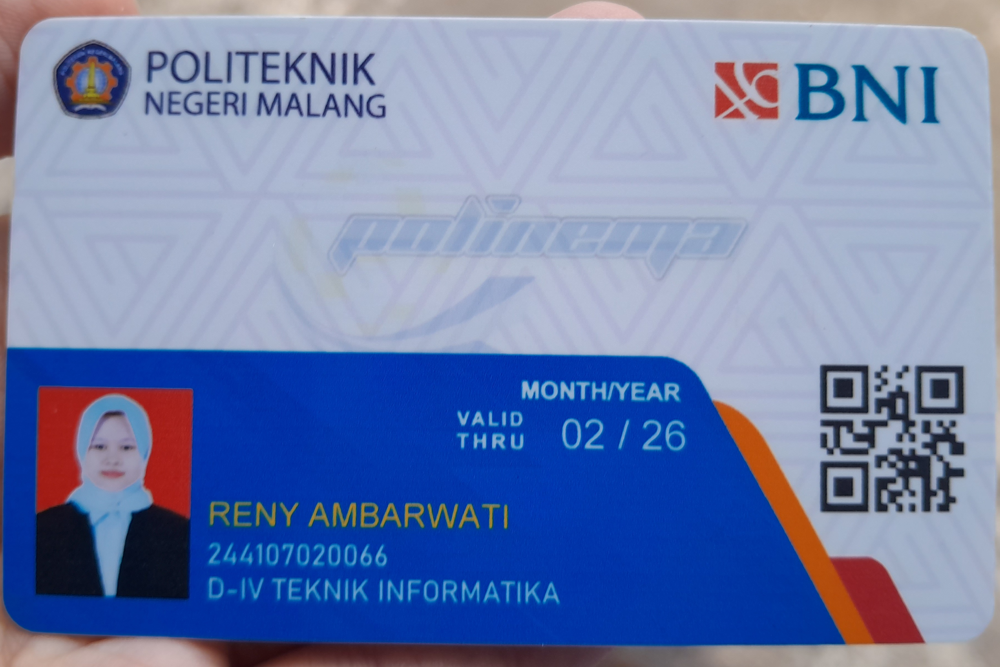

Resolusi gambar:  3617  x  2415


In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv.imread('ktm.jpg')
cv2_imshow(img)

print("Resolusi gambar: " , img.shape[1], " x ", img.shape[0])

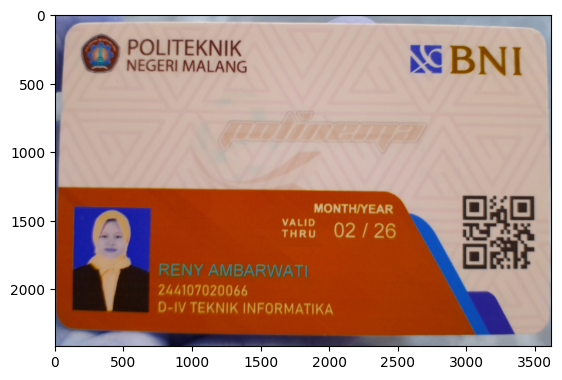

In [ ]:
img = cv.imread('ktm.jpg')
plt.imshow(img)

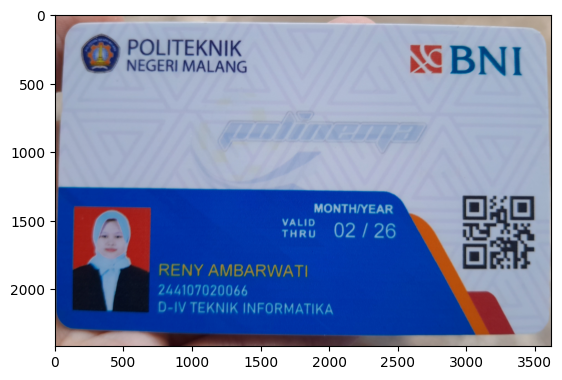

In [ ]:
img = cv.imread('ktm.jpg')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

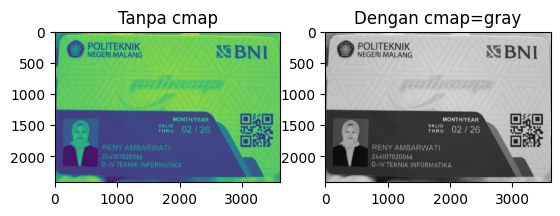

In [ ]:
img_gray = cv.imread('ktm.jpg', cv.IMREAD_GRAYSCALE)
plt.subplot(1, 2, 1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap=gray')

plt.show()

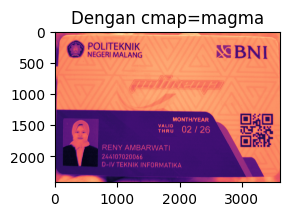

In [ ]:
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='magma')
plt.title('Dengan cmap=magma')

plt.show()

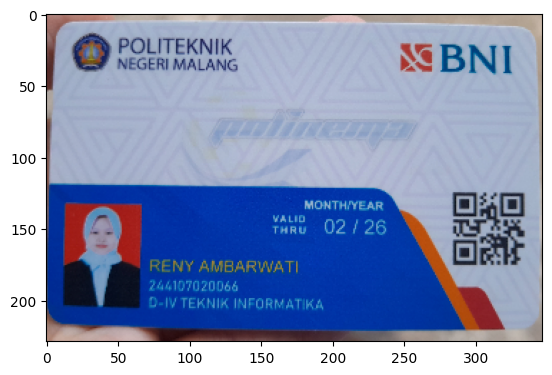

In [ ]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_output = cv.resize(img_rgb, (347, 229))
plt.imshow(img_output)

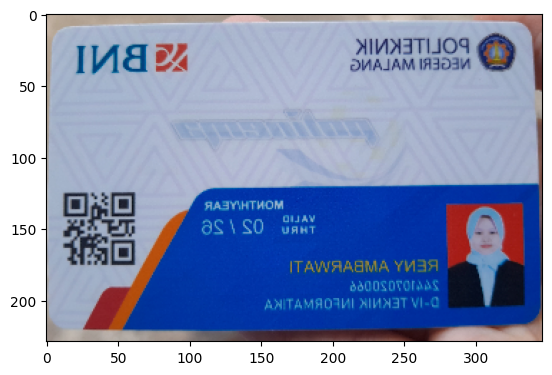

In [ ]:
imgFlip = cv.flip(img_output, 1)
plt.imshow(imgFlip)

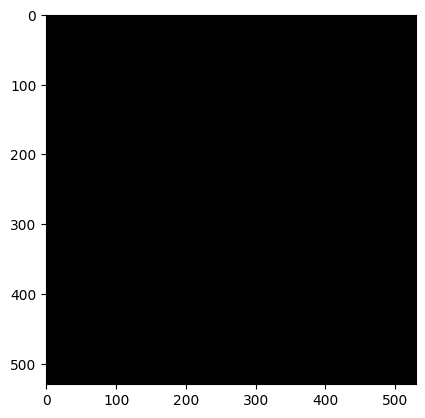

In [ ]:
black_img2 = np.zeros(shape=(530,530,3), dtype=np.int32)
plt.imshow(black_img2)

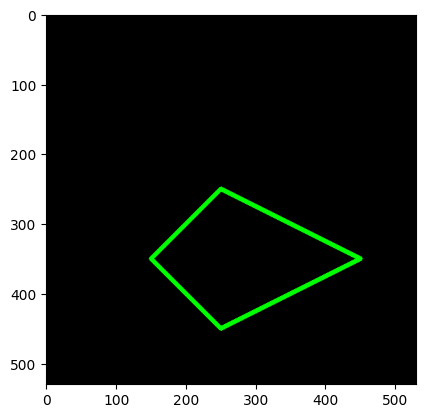

In [ ]:
vertices = np.array([[150,350], [250,250], [450,350], [250,450]],dtype=np.int32)
vertices
pts = vertices.reshape((-1,1,2)) # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yg mewakili R, G, dan B
pts
cv.polylines(black_img2, [pts],isClosed=True,color=(0,255,0),thickness=5)
plt.imshow(black_img2)

# PERTANYAAN PRAKTIKUM

## 1. Mengapa `cv2_imshow()` dan `plt.imshow()` tanpa konversi berbeda?
Jawaban:  karena OpenCV membaca dan menyimpan citra berwarna dalam urutan BGR (Blue, Green, Red), sedangkan Matplotlib menganggap citra berwarna memiliki urutan RGB (Red, Green, Blue).

Akibatnya, apabila citra hasil cv2.imread() langsung diberikan kepada plt.imshow() tanpa konversi, kanal biru dan merah akan tertukar sehingga warna citra yang ditampilkan menjadi berbeda.


In [ ]:
img = cv.imread('ktm.jpg')

# Konversi BGR ke RGB
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Pilih piksel yang sama
y = img.shape[0] // 2
x = img.shape[1] // 2

# Nilai piksel dari citra BGR
p_bgr = img[y, x]

# Nilai piksel dari citra RGB
p_rgb = img_rgb[y, x]

print("Koordinat piksel (x, y):", (x, y))
print("Nilai BGR dari cv2.imread():", p_bgr)
print("Nilai RGB setelah cvtColor():", p_rgb)
print("BGR dibalik urutannya:", p_bgr[::-1])

Koordinat piksel (x, y): (1808, 1207)
Nilai BGR dari cv2.imread(): [208 185 177]
Nilai RGB setelah cvtColor(): [177 185 208]
BGR dibalik urutannya: [177 185 208]


hasil tampilan berbeda bukan karena nilai piksel berubah saat `plt.imshow()` dipanggil, tetapi karena Matplotlib dan OpenCV memakai konvensi urutan kanal yang berbeda.


## 2. Bandingkan kanvas `int16` dan `int32`
Keduanya dibuat dengan ukuran sama. `min()` dan `max()` bernilai sama karena seluruh elemen diinisialisasi nol, tetapi `nbytes` berbeda karena `int32` menggunakan 4 byte per elemen sedangkan `int16` menggunakan 2 byte.


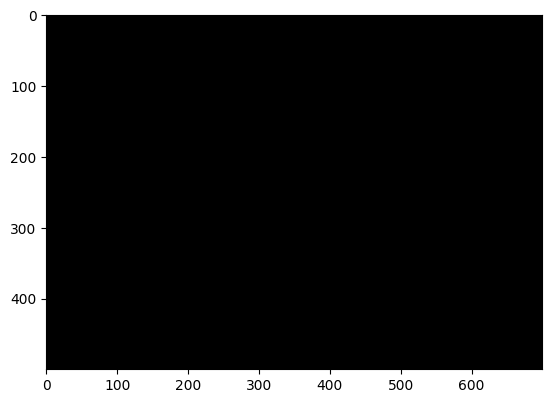

In [ ]:
H, W = 500, 700

canvas_int16 = np.zeros((H, W, 3), dtype=np.int16)
canvas_int32 = np.zeros((H, W, 3), dtype=np.int32)

plt.imshow(canvas_int16)



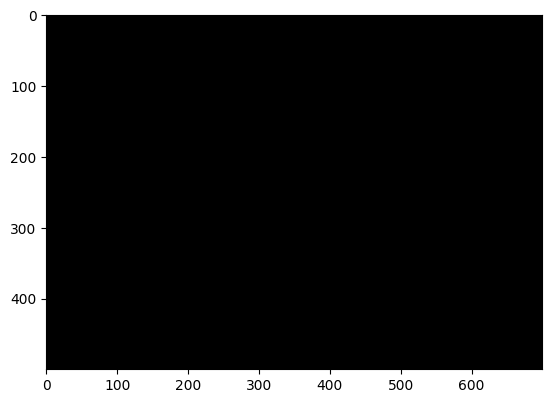

In [ ]:
plt.imshow(canvas_int32)

**Jawaban:** tampilan awal kedua kanvas sama-sama hitam karena seluruh piksel bernilai 0. Ukuran memori berbeda karena `int16` memakai 2 byte per elemen, sedangkan `int32` memakai 4 byte per elemen. Untuk jumlah elemen yang sama, `int32` membutuhkan 2× memori `int16`.


## 3. Kegunaan `cv2_imshow()` dan alasan `cv2.imshow()` tidak digunakan di Colab
**Jawaban:**`cv2.imshow()` bawaan OpenCV berfungsi untuk membuat jendela GUI pada sistem operasi desktop, sedangkan lingkungan Google Colab tidak menyediakan jendela GUI tersebut seperti komputer lokal. Karena itu `cv2_imshow()` tidak digunakan di Colab.

## 4. Perbandingan `skimage.io.imread()` dan `cv2.cvtColor(..., BGR2RGB)`
Keduanya akan benar jika digunakan sesuai sumbernya:
- `skimage.io.imread()` membaca citra berwarna sebagai **RGB**.
- `cv2.imread()` membaca sebagai **BGR**, sehingga perlu `cv2.cvtColor(..., COLOR_BGR2RGB)` sebelum dibandingkan sebagai RGB.

Pembuktian menggunakan nilai piksel.


skimage shape : (2415, 3617, 3)
skimage dtype : uint8
OpenCV RGB shape : (2415, 3617, 3)
OpenCV RGB dtype : uint8

Koordinat piksel (x, y): (1808, 1207)
Piksel skimage RGB     : [177 185 208]
Piksel OpenCV RGB      : [177 185 208]
Nilai piksel sama?     : True


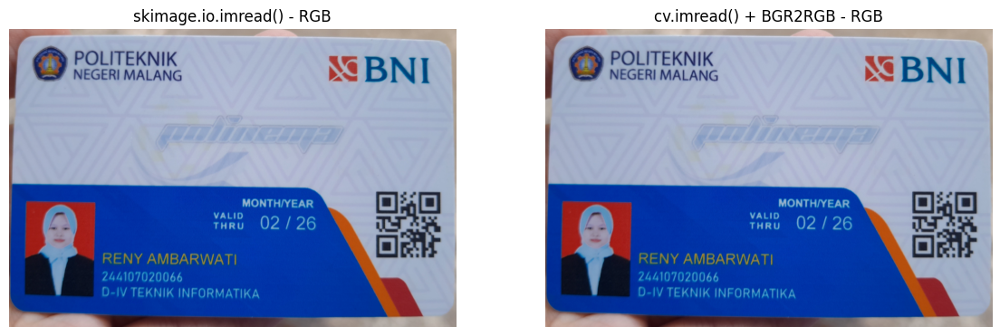

In [ ]:
img_skimage = io.imread('/content/drive/MyDrive/PCVK 2026/ktp.jpg')

# Baca file dengan OpenCV
img_bgr = cv.imread('/content/drive/MyDrive/PCVK 2026/ktp.jpg')

# Konversi BGR menjadi RGB
img_cv_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# Tampilkan informasi citra
print("skimage shape :", img_skimage.shape)
print("skimage dtype :", img_skimage.dtype)

print("OpenCV RGB shape :", img_cv_rgb.shape)
print("OpenCV RGB dtype :", img_cv_rgb.dtype)

# Ambil piksel pada bagian tengah gambar
y = img_skimage.shape[0] // 2
x = img_skimage.shape[1] // 2

print("\nKoordinat piksel (x, y):", (x, y))
print("Piksel skimage RGB     :", img_skimage[y, x])
print("Piksel OpenCV RGB      :", img_cv_rgb[y, x])

# Bandingkan nilai piksel
print("Nilai piksel sama?     :",
      np.array_equal(img_skimage[y, x], img_cv_rgb[y, x]))

# Tampilkan kedua citra
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

ax[0].imshow(img_skimage)
ax[0].set_title('skimage.io.imread() - RGB')
ax[0].axis('off')

ax[1].imshow(img_cv_rgb)
ax[1].set_title('cv.imread() + BGR2RGB - RGB')
ax[1].axis('off')

plt.show()

**Jawaban:** `skimage.io.imread()` menampilkan warna sebenarnya karena pembacaan citra berwarna menggunakan urutan RGB. Hasil `cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)` juga menampilkan warna sebenarnya karena urutan BGR dari OpenCV telah diubah menjadi RGB. Jika `cv2.cvtColor(..., BGR2RGB)` diterapkan pada citra yang sudah RGB dari skimage, kanal justru akan tertukar.


## 5. Jelaskan perbedaan antara mengubah ukuran citradan mengubah ukuran tampilan.
**Jawaban:** memperbesar `figsize` hanya memperbesar kanvas tampilan Matplotlib. Jumlah piksel citra tidak berubah, sehingga `img.shape` tetap sama. Untuk benar-benar mengubah jumlah piksel digunakan `cv2.resize()`.


# TUGAS PRAKTIKUM — PENERAPAN

Berdasarkan praktikum bagian 1 dan 2 kerjakan beberapa tugas berikut :

 1. Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau-Biru
saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.
 2. Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan
keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi
label.
 3. Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah /
badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan
teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda
tentukan sendiri.

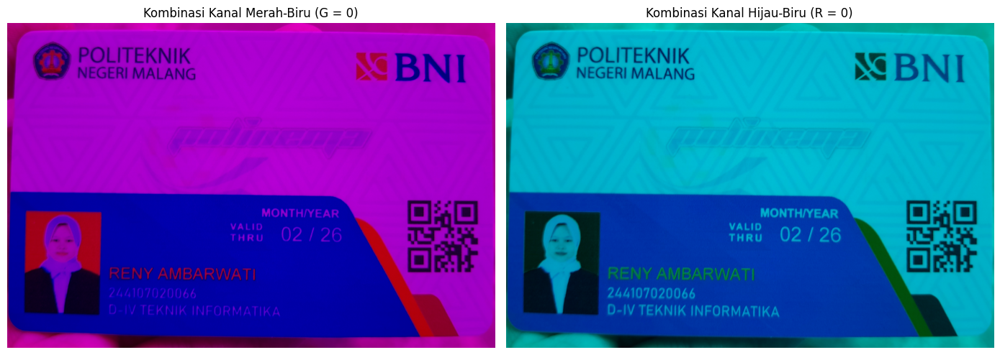

In [21]:
# BGR index: B=0, G=1, R=2
red_blue = img_bgr.copy()
red_blue[:, :, 1] = 0

green_blue = img_bgr.copy()
green_blue[:, :, 2] = 0

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(cv.cvtColor(red_blue, cv.COLOR_BGR2RGB))
axes[0].set_title('Kombinasi Kanal Merah-Biru (G = 0)')
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(green_blue, cv.COLOR_BGR2RGB))
axes[1].set_title('Kombinasi Kanal Hijau-Biru (R = 0)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

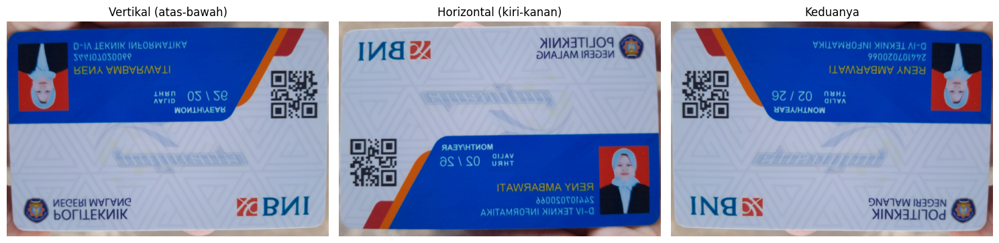

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

hasil_flip = [
    cv.flip(img_bgr, 0),
    cv.flip(img_bgr, 1),
    cv.flip(img_bgr, -1)
]
judul_flip = [
    'Vertikal (atas-bawah)',
    'Horizontal (kiri-kanan)',
    'Keduanya'
]

for ax, im, title in zip(axes, hasil_flip, judul_flip):
    ax.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


Resolusi gambar:  3072  x  4096


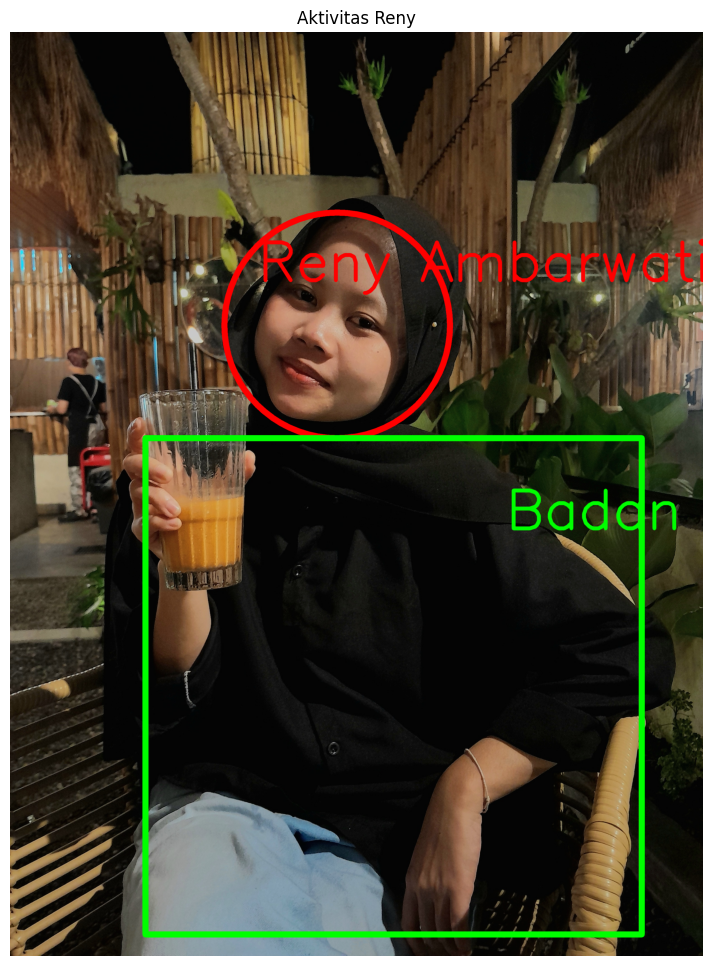

In [40]:
img = cv.imread('/content/drive/MyDrive/PCVK 2026/ambar.jpg')

print("Resolusi gambar: " , img.shape[1], " x ", img.shape[0])
img_draw = cv.cvtColor(img, cv.COLOR_BGR2RGB)
# 1. Circle di Wajah (Warna Merah)
cv.circle(img_draw, center=(1450, 1300), radius=500, color=(255, 0, 0), thickness=25)
cv.putText(img_draw, text='Reny Ambarwati', org=(1100, 1100), fontFace=cv.FONT_HERSHEY_SIMPLEX, fontScale=8, color=(255, 0, 0), thickness=15, lineType=cv.LINE_AA)

# 2. Rectangle di Badan (Warna Hijau)
cv.rectangle(img_draw, pt1=(600, 1800), pt2=(2800, 4000), color=(0, 255, 0), thickness=25)
cv.putText(img_draw, text='Badan', org=(2200, 2200), fontFace=cv.FONT_HERSHEY_SIMPLEX, fontScale=8, color=(0, 255, 0), thickness=15, lineType=cv.LINE_AA)

plt.figure(figsize=(10, 12))
plt.imshow(img_draw)
plt.title('Aktivitas Reny')
plt.axis('off')
plt.show()